# Dementia diagnosis using NPIQ results and AI
- NPIQ stands for Neuropsychiatric Inventory Questionnaire
[- ![image.png](attachment:image.png)](https://www.alz.org/media/documents/npiq-questionnaire.pdf)
- Instead of simply adding each scores, let's use AI to evaluate the results!
- We will take scores for each task and feed it into AI model 
## Preprocessing
- We need to preprocess diagnosis.csv and npiq.csv
### Drop Unnecessary columns and NAs
#### npiq.csv
- column names starting with MM refers to each tasks(Exclude MMLTR~s because they are duplicates)
- PTID and VISDATE is needed for merging with diagnosis data

In [3]:
import pandas as pd
npiq=pd.read_csv('npiq.csv')

In [4]:
NUM_SYMPTOMS=12
symptoms=['NPI'+chr(i) for i in range(65, 65+NUM_SYMPTOMS)]
print(symptoms)
severities=[symtom+'SEV' for symtom in symptoms]
print(severities)

['NPIA', 'NPIB', 'NPIC', 'NPID', 'NPIE', 'NPIF', 'NPIG', 'NPIH', 'NPII', 'NPIJ', 'NPIK', 'NPIL']
['NPIASEV', 'NPIBSEV', 'NPICSEV', 'NPIDSEV', 'NPIESEV', 'NPIFSEV', 'NPIGSEV', 'NPIHSEV', 'NPIISEV', 'NPIJSEV', 'NPIKSEV', 'NPILSEV']


In [5]:
print(npiq['NPIA'].value_counts(dropna=False))
npiq2=npiq[npiq[symptoms].isin([0,1]).all(axis=1)]
print(npiq2['NPIA'].value_counts(dropna=False))

NPIA
 0.0    6809
 1.0     246
 NaN      34
 2.0      19
-1.0      18
Name: count, dtype: int64
NPIA
0.0    6748
1.0     243
Name: count, dtype: int64


In [6]:
print(npiq2['NPIASEV'].value_counts(dropna=False))
npiq3=npiq2.copy()
npiq3[severities] = npiq3[severities].replace(-4, 0).fillna(0)
print(npiq3['NPIASEV'].value_counts(dropna=False))

NPIASEV
-4.0    3640
 NaN    3108
 1.0     137
 2.0      76
 3.0      30
Name: count, dtype: int64
NPIASEV
0.0    6748
1.0     137
2.0      76
3.0      30
Name: count, dtype: int64


In [7]:
npiq4=npiq3.copy()
npiq4 = npiq4[~((npiq4[symptoms] == 1) & (npiq4[severities] == 0)).all(axis=1)]

In [8]:
npiq4[['PTID','VISDATE']+severities]
npiq5=npiq4.copy()[['PTID','VISDATE']+severities]
npiq5.to_csv('npiq_clean.csv', index=False)

In [9]:
diagnosis=pd.read_csv('diagnosis.csv')
print(diagnosis['DIAGNOSIS'].value_counts(dropna=False))
diagnosis2=diagnosis.dropna(subset=['DIAGNOSIS'])
diagnosis2['DIAGNOSIS'].value_counts(dropna=False)

DIAGNOSIS
2.0    5939
1.0    5221
3.0    2800
NaN      29
Name: count, dtype: int64


DIAGNOSIS
2.0    5939
1.0    5221
3.0    2800
Name: count, dtype: int64

In [10]:
diagnosis3=diagnosis2.copy()[['PTID','EXAMDATE','DIAGNOSIS']]
diagnosis3.to_csv('diagnosis_clean.csv', index=False)

In [11]:
npiq5['DATE'] = pd.to_datetime(npiq5['VISDATE']).dropna()
# npiq5['VISDATE']=npiq5['VISDATE'].fillna(npiq5['VISDATE'].mode()[0])

diagnosis3['DATE'] = pd.to_datetime(diagnosis3['EXAMDATE']).dropna()
# diagnosis3['EXAMDATE']=diagnosis3['EXAMDATE'].fillna(diagnosis3['EXAMDATE'].mode()[0])

[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]
[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0, 0.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 0.0, 1.0, 0.0]
[0.0, 0.0, 0.0, 0.0, 0.0

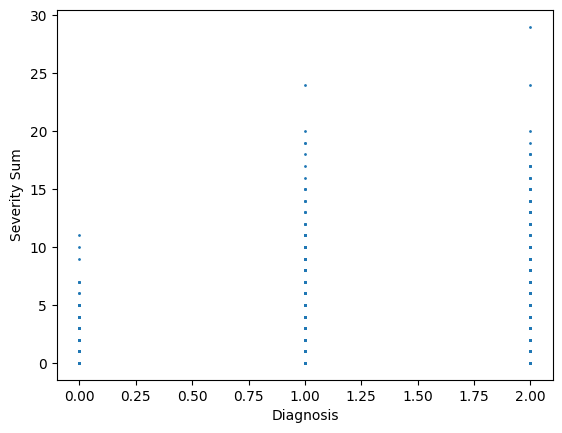

In [16]:
merged_df = pd.merge(npiq5, diagnosis3, on=['PTID','DATE'], how='inner')
merged_df['DIAGNOSIS']=merged_df['DIAGNOSIS']-1
merged_df['SEVSUM']=merged_df[severities].sum(axis=1)

# delete rows with diagnosis non 0, but severity sum is 0
for row in merged_df[(merged_df['SEVSUM']==1) & (merged_df['DIAGNOSIS']==0)].iterrows():
    print(row[1][severities].to_list())


# scatter plot
import matplotlib.pyplot as plt
plt.scatter(merged_df['DIAGNOSIS'], merged_df['SEVSUM'], s=1, )   
plt.xlabel('Diagnosis')
plt.ylabel('Severity Sum')
plt.show()

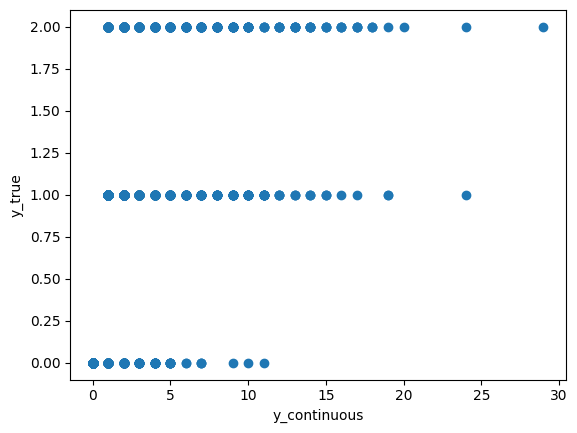

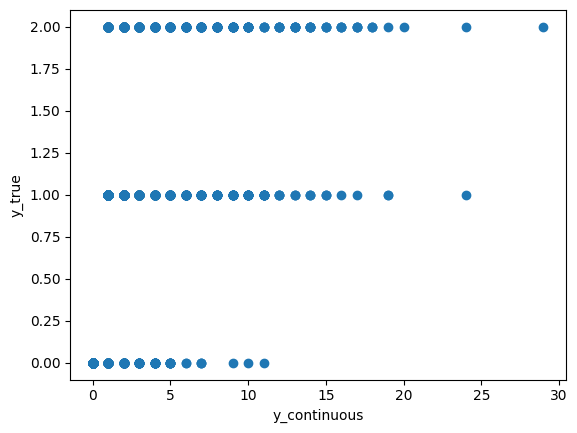

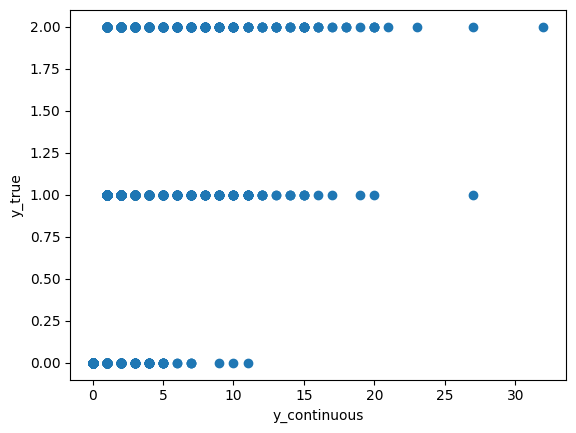

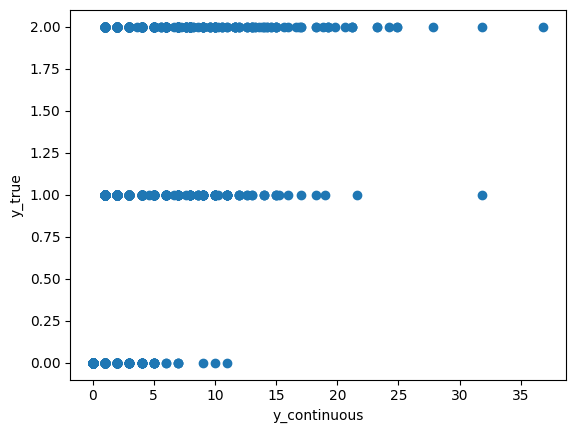

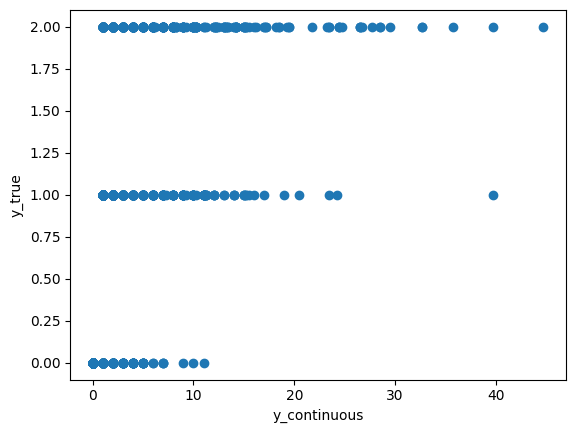

...

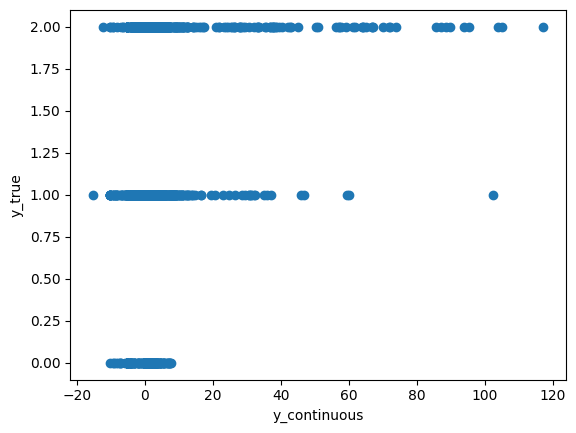

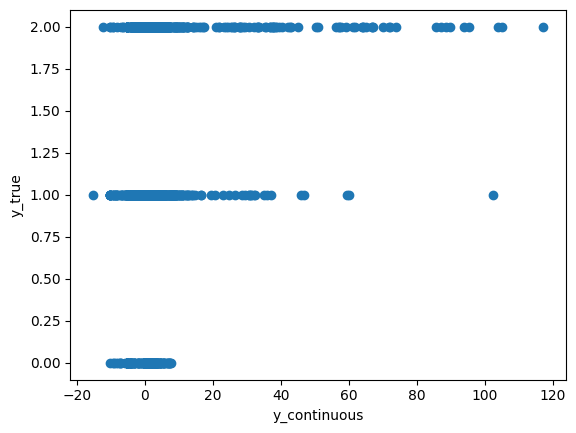

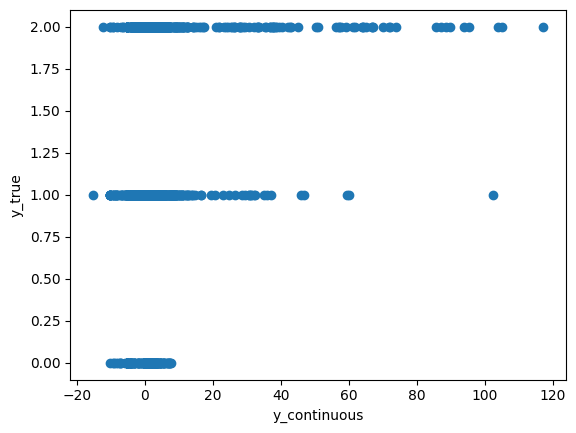

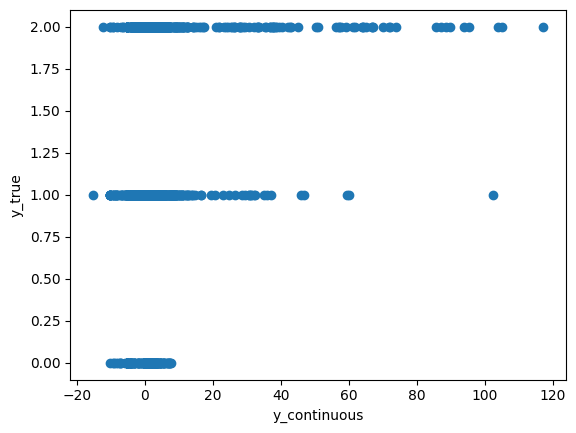

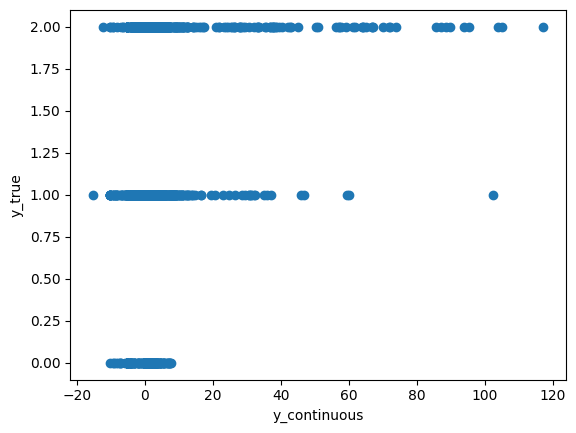

KeyboardInterrupt: 

In [503]:
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix
from scipy.optimize import minimize

# Assuming merged_df and severities are already defined
X = merged_df[severities].values
y = merged_df['DIAGNOSIS'].values

# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.1, random_state=42)

# Define a function to classify based on thresholds
def classify(y_continuous, thresholds):
    if y_continuous < thresholds[0]:
        return 0
    elif y_continuous < thresholds[1]:
        return 1
    else:
        return 2

# Define a function to optimize weights
def optimize_weights(weights, X, y_true):
    y_continuous = np.dot(X, weights)
    
    # Determine optimal thresholds based on the training data
    data=np.concatenate((y_continuous.reshape(-1,1), y_true.reshape(-1,1)), axis=1)
    #scatter plot
    import matplotlib.pyplot as plt
    plt.scatter(data[:,0], data[:,1])
    plt.xlabel('y_continuous')
    plt.ylabel('y_true')
    plt.show()
    
    threshold_0 = np.max(y_continuous[y_true == 0]) + np.min(y_continuous[y_true == 1]) / 2
    threshold_1 = np.max(y_continuous[y_true == 1]) + np.min(y_continuous[y_true == 2]) / 2
    thresholds = [threshold_0, threshold_1]
    
    y_pred_class = [classify(y, thresholds) for y in y_continuous]
    return -accuracy_score(y_true, y_pred_class)  # Negative accuracy for minimization

# Initial guess for weights
initial_weights = np.ones(X_train.shape[1])

# Optimize weights using the training data
result = minimize(optimize_weights, initial_weights, args=(X_train, y_train), method='Powell')
optimal_weights = result.x

# Predict continuous output using optimized weights
y_pred_continuous_train = np.dot(X_train, optimal_weights)
y_pred_continuous_test = np.dot(X_test, optimal_weights)

# Determine optimal thresholds based on the training data
optimal_thresholds = [np.max(y_pred_continuous_train[y_train == 0]) + np.min(y_pred_continuous_train[y_train == 1]) / 2,
                      np.max(y_pred_continuous_train[y_train == 1]) + np.min(y_pred_continuous_train[y_train == 2]) / 2]

# Apply optimal thresholds to classify the test data
y_pred_class = [classify(y, optimal_thresholds) for y in y_pred_continuous_test]

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_class)
conf_matrix = confusion_matrix(y_test, y_pred_class)

print(f"Optimal Weights: {optimal_weights}")
print(f"Optimal Thresholds: {optimal_thresholds}")
print(f"Accuracy: {accuracy}")
print("Confusion Matrix:")
print(conf_matrix)
print(f"Optimization Success (Weights): {result.success}")
print(f"Optimization Message (Weights): {result.message}")

In [250]:
import numpy as np
import matplotlib.pyplot as plt

# Get predicted probabilities
y_probs = model.predict_proba(X_test)

# Choose the class with the highest probability as the predicted class
y_pred_proba = y_probs[np.arange(len(y_probs)), y_pred]


IndexError: arrays used as indices must be of integer (or boolean) type

In [198]:
merged_df.to_csv('merged.csv', index=False)

In [193]:
merged_df['date_diff'] = (merged_df['EXAMDATE'] - merged_df['VISDATE']).abs()

In [194]:
print(merged_df['date_diff'].isnull().sum())
closest_diagnosis_df = merged_df.loc[merged_df.groupby('NPIQID')['date_diff'].idxmin()]

# Optionally drop the 'date_diff' column if no longer needed
closest_diagnosis_df = closest_diagnosis_df.drop(columns=['date_diff'])

# Display the final DataFrame
# print(closest_diagnosis_df)
print(closest_diagnosis_df.info())
closest_diagnosis_df.to_csv('npiqXdiagnosis.csv', index=False)

0
<class 'pandas.core.frame.DataFrame'>
Index: 6991 entries, 0 to 49774
Data columns (total 29 columns):
 #   Column     Non-Null Count  Dtype         
---  ------     --------------  -----         
 0   NPIQID     6991 non-null   int64         
 1   PTID       6991 non-null   object        
 2   VISDATE    6991 non-null   datetime64[ns]
 3   NPIA       6991 non-null   float64       
 4   NPIB       6991 non-null   float64       
 5   NPIC       6991 non-null   float64       
 6   NPID       6991 non-null   float64       
 7   NPIE       6991 non-null   float64       
 8   NPIF       6991 non-null   float64       
 9   NPIG       6991 non-null   float64       
 10  NPIH       6991 non-null   float64       
 11  NPII       6991 non-null   float64       
 12  NPIJ       6991 non-null   float64       
 13  NPIK       6991 non-null   float64       
 14  NPIL       6991 non-null   float64       
 15  NPIASEV    6991 non-null   float64       
 16  NPIBSEV    6991 non-null   float64       
 1